<a href="https://colab.research.google.com/github/shri7799/sampleRepo/blob/master/EEGproject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install mne


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 50.3 MB/s eta 0:00:00


In [ ]:
!pip install numpy


In [ ]:
%matplotlib inline

In [ ]:
"Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"

Creating RawArray with float64 data, n_channels=8, n_times=29781
    Range : 0 ... 29780 =      0.000 ...   119.120 secs
Ready.


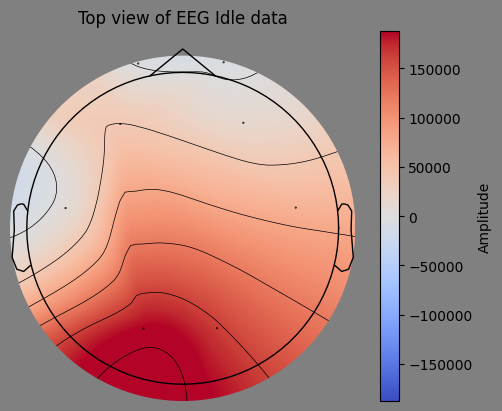

In [3]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Replace 'your_data_file.xlsx' with the actual file name and 'Sheet1' with the sheet containing EEG data
eeg_data = pd.read_excel('/content/EEGdata/AARIN om.xlsx')

# Convert EEG data to a NumPy array
data = eeg_data.values.T  # Transpose the data to have channels as rows and time samples as columns

# Specify the channel names ("Fp1", "T7", "P3", "O1", "O2", "P4", "T8", "Fp2")
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Create a dummy info object with the number of channels
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Assuming a sampling frequency of 500 Hz

# Create a raw object from the data
raw = mne.io.RawArray(data, info)

# Set EEG channel types if they are not already set
raw.set_channel_types({ch: 'eeg' for ch in channel_names})

# Use the 10-20 system to set the digitization points for the available channels
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Enable inline plotting in Colab
%matplotlib inline

# Plot the EEG topography on a standard 3D brain model with a grey background
fig = plt.figure(facecolor='grey')  # Set the background color of the figure to grey

# Create a custom color scale by rescaling the data
data_rescaled = (data - data.min()) / (data.max() - data.min())

# Plot the topomap with custom color scale using imshow
image, _ = mne.viz.plot_topomap(data.mean(axis=1), pos=raw.info, axes=fig.add_subplot(111),
                                show=False, cmap='coolwarm')

# Customize the colorbar
cbar = plt.colorbar(image, ax=fig.get_axes(), orientation='vertical', pad=0.05)
cbar.set_label('Amplitude')  # Set the label for the colorbar

# Add a title and show the plot
plt.title('Top view of EEG Idle data')
plt.show()


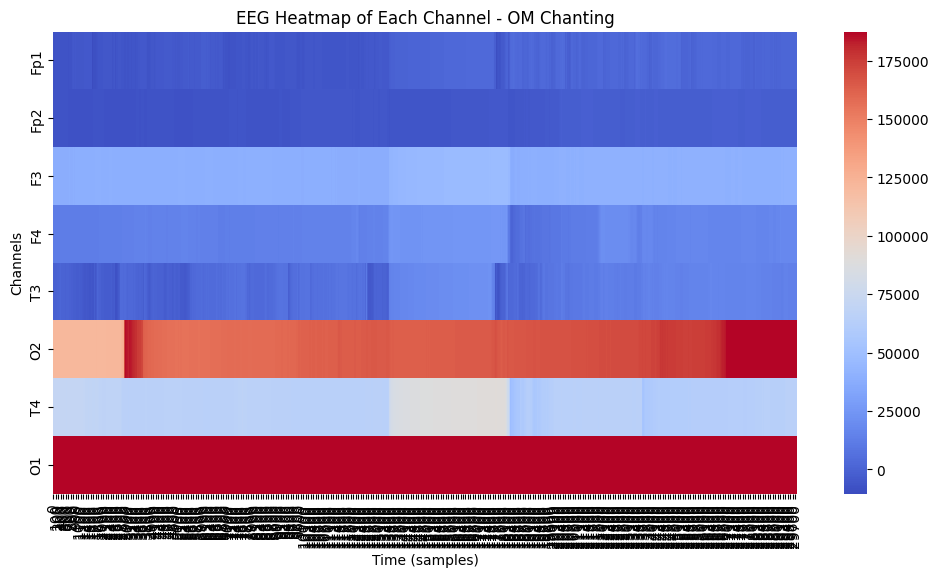

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/AARIN om.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Create a pandas DataFrame for easy plotting
df = pd.DataFrame(data.T, columns=channel_names)  # DataFrame with channels as columns and time as rows

# Plot the heatmap of each channel
plt.figure(figsize=(12, 6))
sns.heatmap(df.T, cmap='coolwarm', cbar=True, xticklabels=100)  # Transpose the DataFrame for channels on the y-axis
plt.title('EEG Heatmap of Each Channel - OM Chanting')
plt.xlabel('Time (samples)')
plt.ylabel('Channels')

# Show the plot
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=29781
    Range : 0 ... 29780 =      0.000 ...   119.120 secs
Ready.


<Figure size 600x500 with 0 Axes>

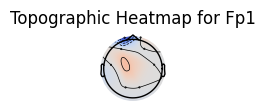

<Figure size 600x500 with 0 Axes>

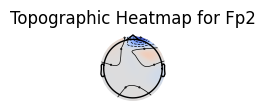

<Figure size 600x500 with 0 Axes>

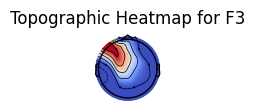

<Figure size 600x500 with 0 Axes>

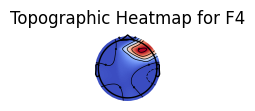

<Figure size 600x500 with 0 Axes>

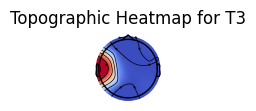

<Figure size 600x500 with 0 Axes>

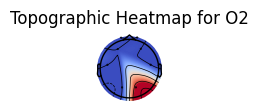

<Figure size 600x500 with 0 Axes>

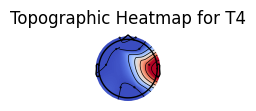

<Figure size 600x500 with 0 Axes>

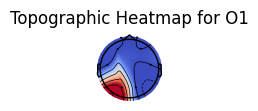

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/AARIN om.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Function to plot the topographic heatmap for each channel
def plot_topomap_for_channel(data, channel_idx, channel_name):
    # Get the data for the selected channel
    channel_data = data[channel_idx, :]  # Select data for the specific channel

    # Compute the average for that channel (you can also plot time points individually)
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[channel_idx] = channel_data.mean()  # Fill only the selected channel's mean value

    # Create a new figure explicitly
    plt.figure(figsize=(6, 5))

    # Plot the topomap with only the selected channel's data
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', show=False)  # Set show=False to avoid premature plotting

    # Add a title for the channel
    plt.title(f'Topographic Heatmap for {channel_name}')

    # Show the plot explicitly after title and settings
    plt.show()

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    plot_topomap_for_channel(data, i, channel_name)


Creating RawArray with float64 data, n_channels=8, n_times=29781
    Range : 0 ... 29780 =      0.000 ...   119.120 secs
Ready.


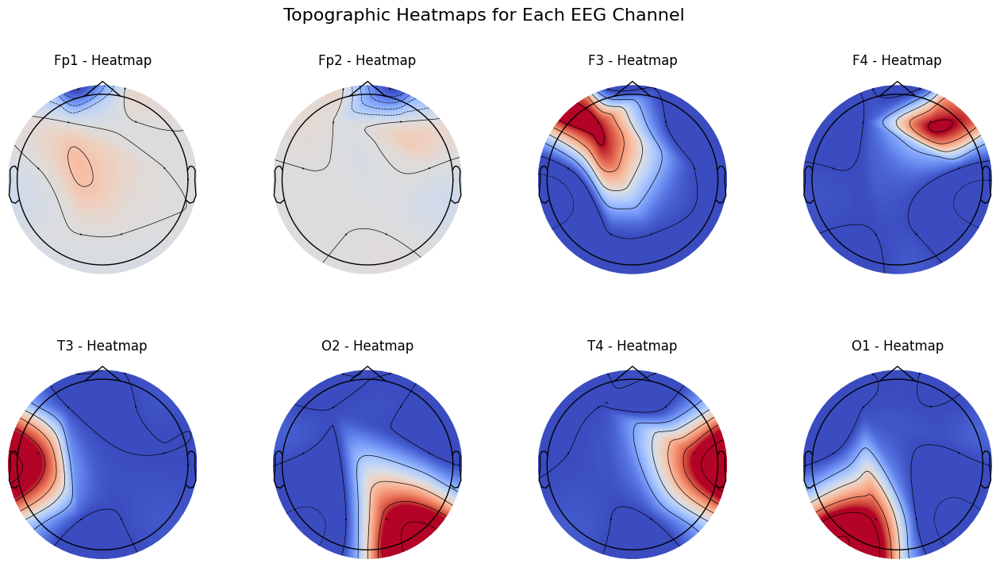

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/AARIN om.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=29745
    Range : 0 ... 29744 =      0.000 ...   118.976 secs
Ready.


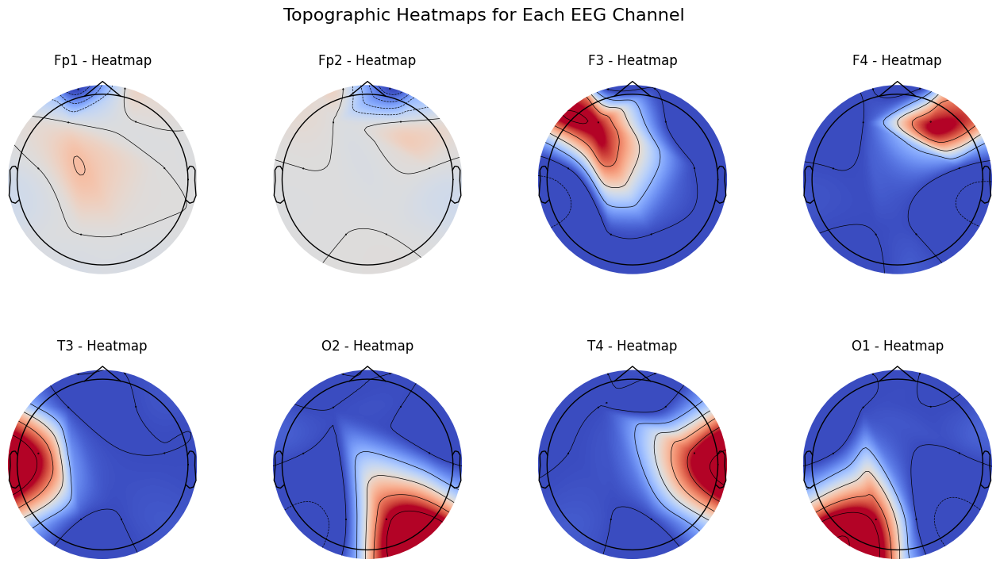

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/AARIN Stress.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=30228
    Range : 0 ... 30227 =      0.000 ...   120.908 secs
Ready.


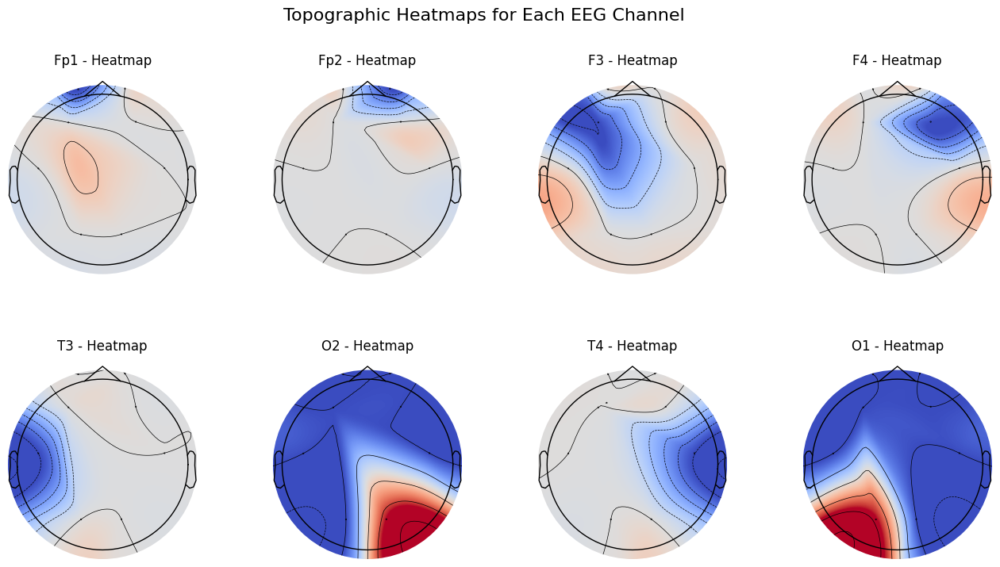

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/AMOGH Stress.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


In [1]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/AMOGH om.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


ModuleNotFoundError: No module named 'mne'

Creating RawArray with float64 data, n_channels=8, n_times=29998
    Range : 0 ... 29997 =      0.000 ...   119.988 secs
Ready.


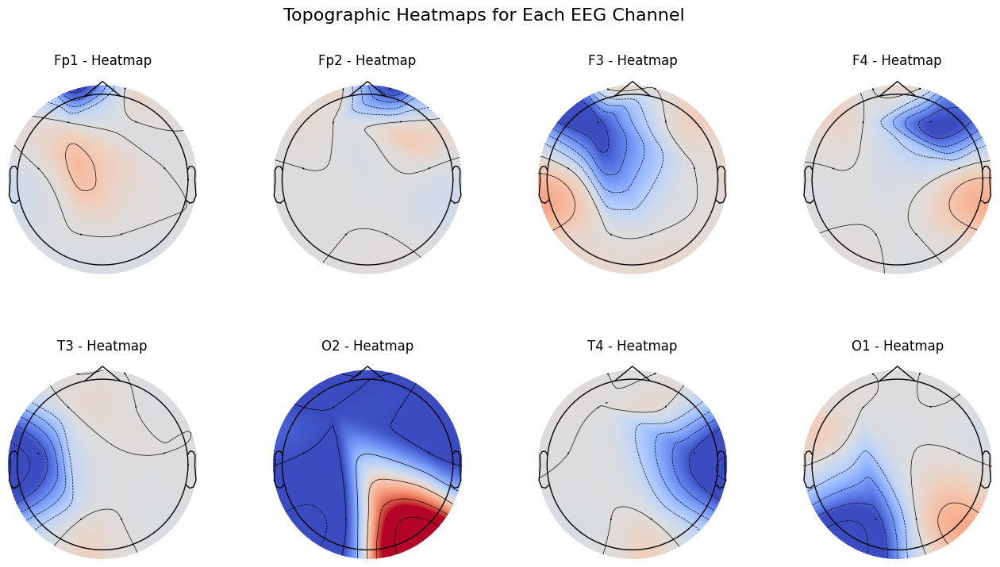

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/DUSHYANTH Om.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=29708
    Range : 0 ... 29707 =      0.000 ...   118.828 secs
Ready.


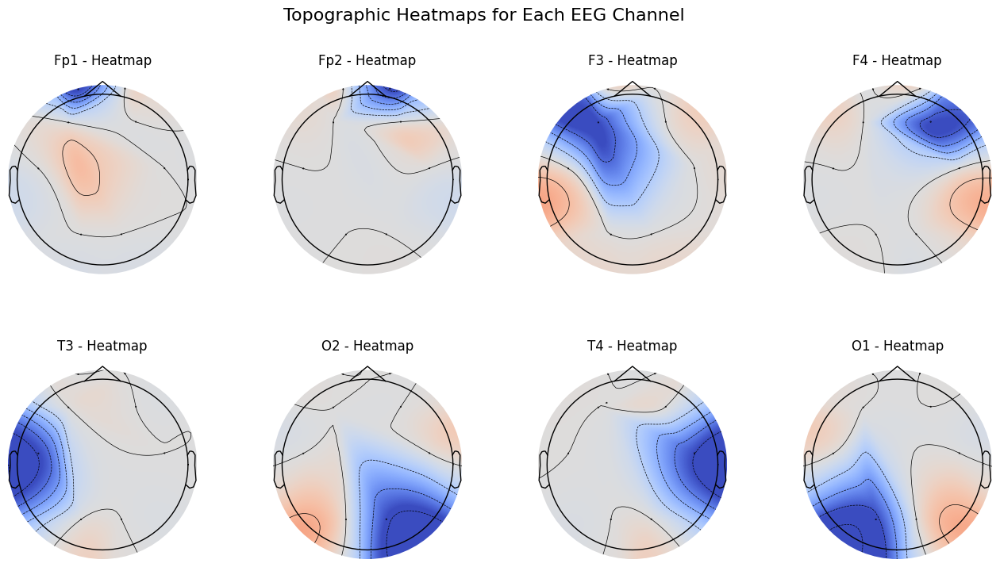

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/DUSHYANTH Stress.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=29652
    Range : 0 ... 29651 =      0.000 ...   118.604 secs
Ready.


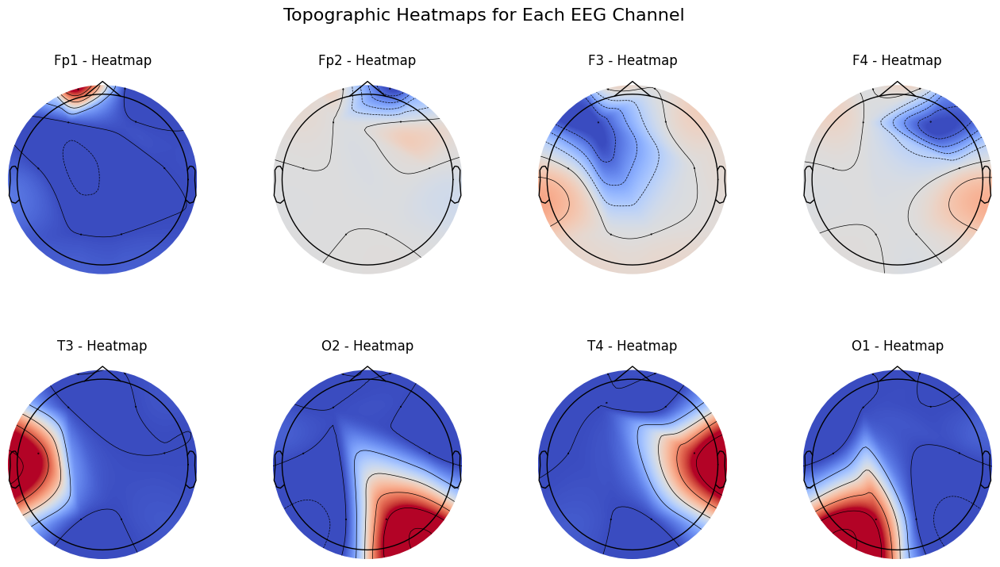

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/GIRISH Om.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=29591
    Range : 0 ... 29590 =      0.000 ...   118.360 secs
Ready.


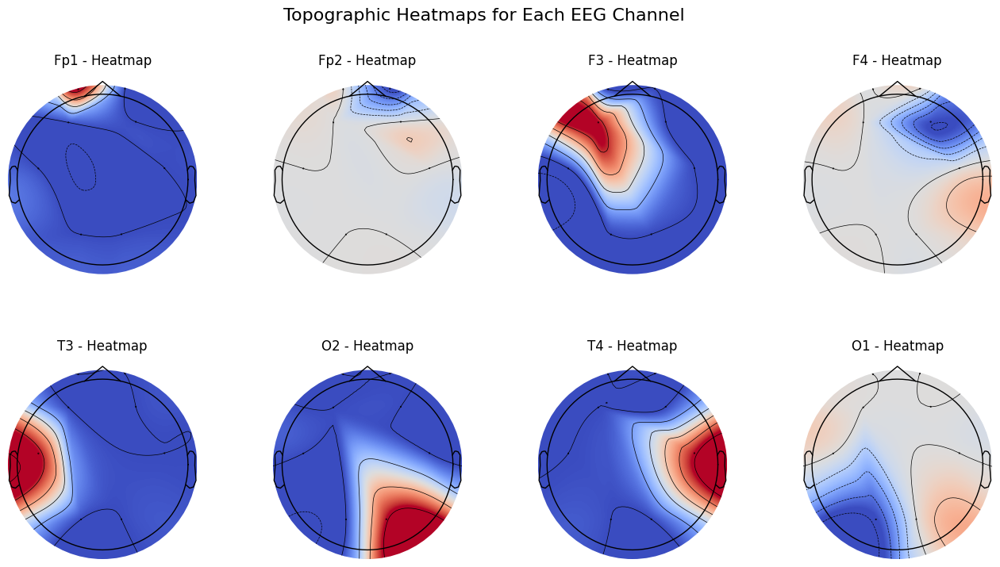

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/GIRISH Stress.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=30834
    Range : 0 ... 30833 =      0.000 ...   123.332 secs
Ready.


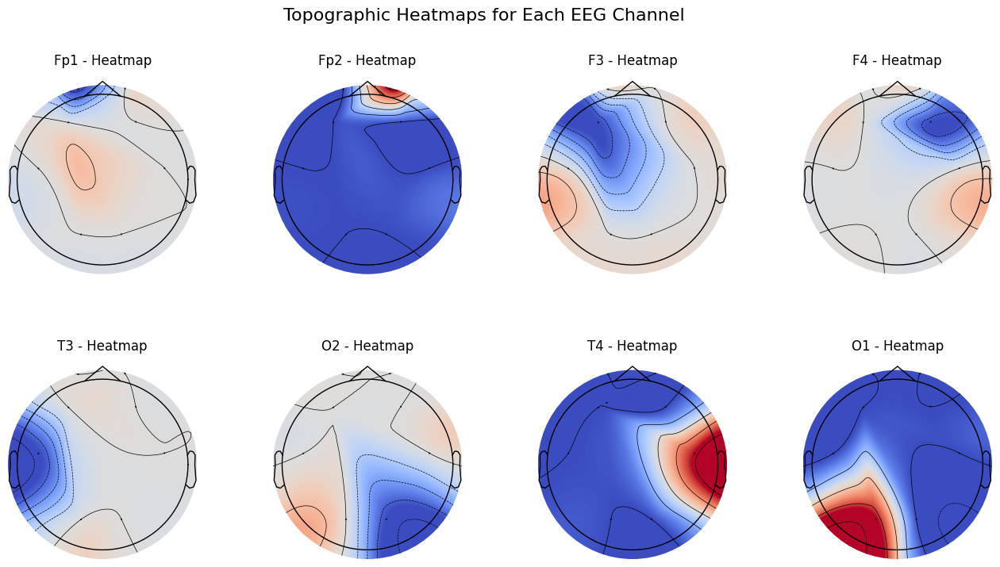

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/MUKUND Om.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=29149
    Range : 0 ... 29148 =      0.000 ...   116.592 secs
Ready.


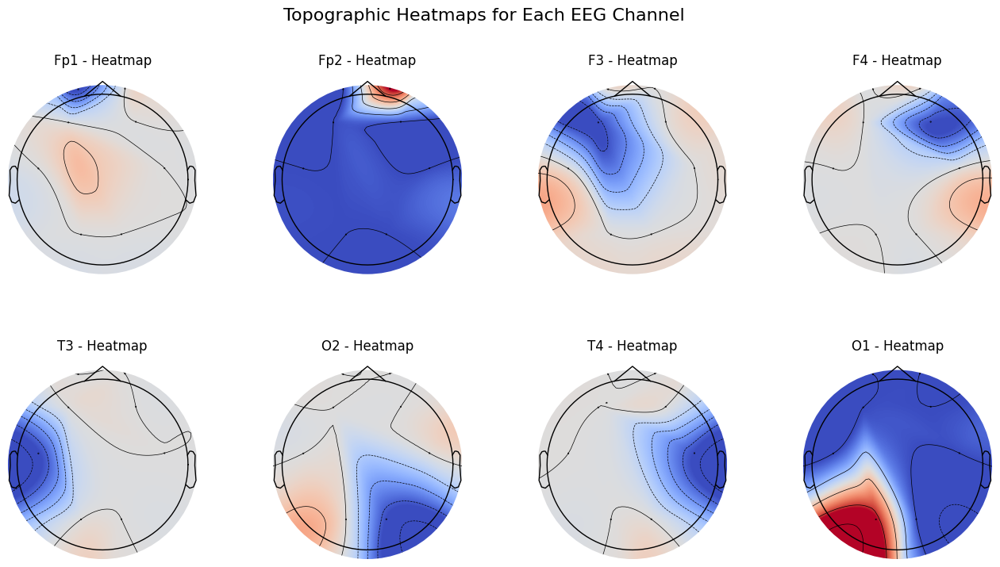

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/MUKUND Stress.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=29859
    Range : 0 ... 29858 =      0.000 ...   119.432 secs
Ready.


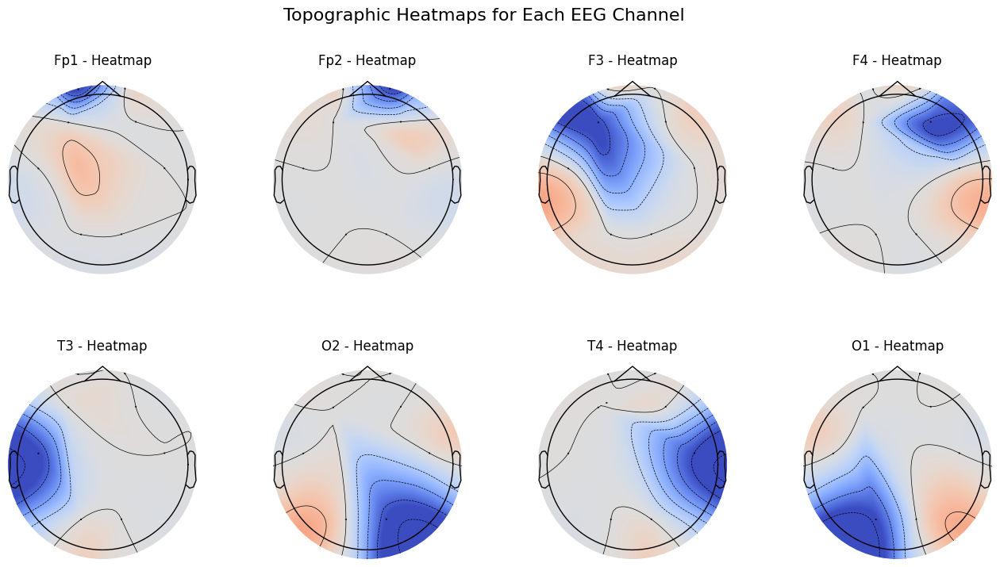

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/NISCHAL Om.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=30385
    Range : 0 ... 30384 =      0.000 ...   121.536 secs
Ready.


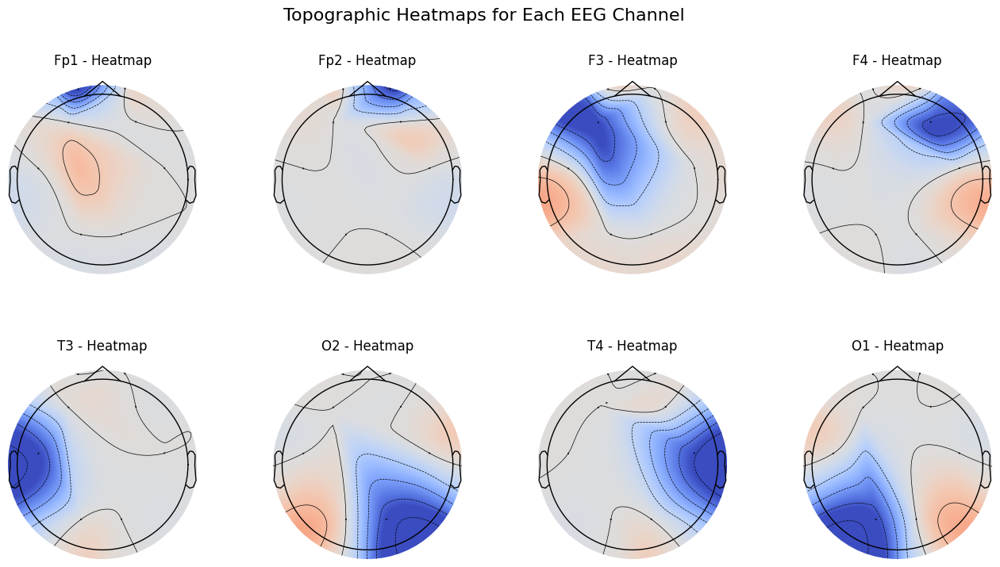

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/NISCHAL Stress.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=30960
    Range : 0 ... 30959 =      0.000 ...   123.836 secs
Ready.


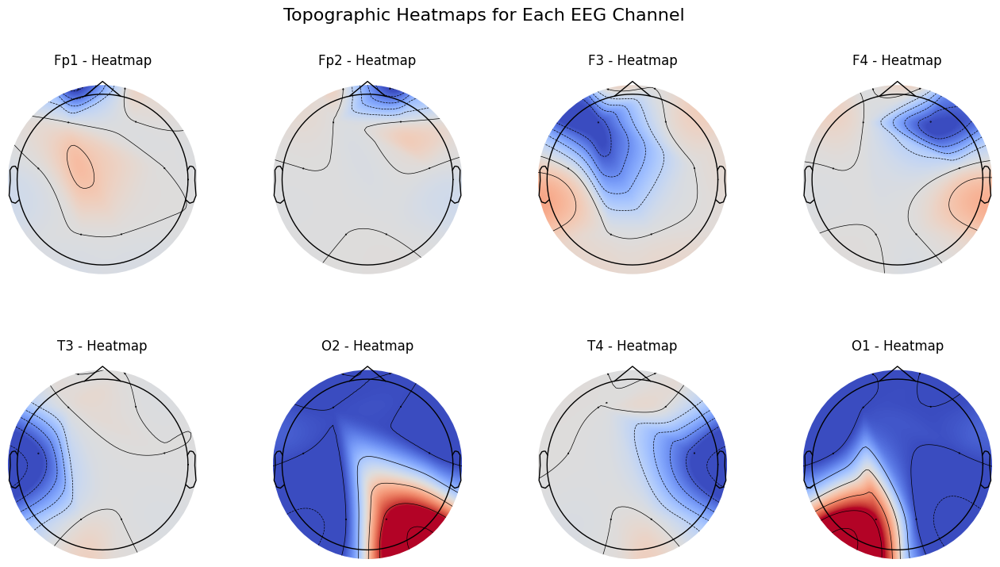

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/SHASHANK Om.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=29813
    Range : 0 ... 29812 =      0.000 ...   119.248 secs
Ready.


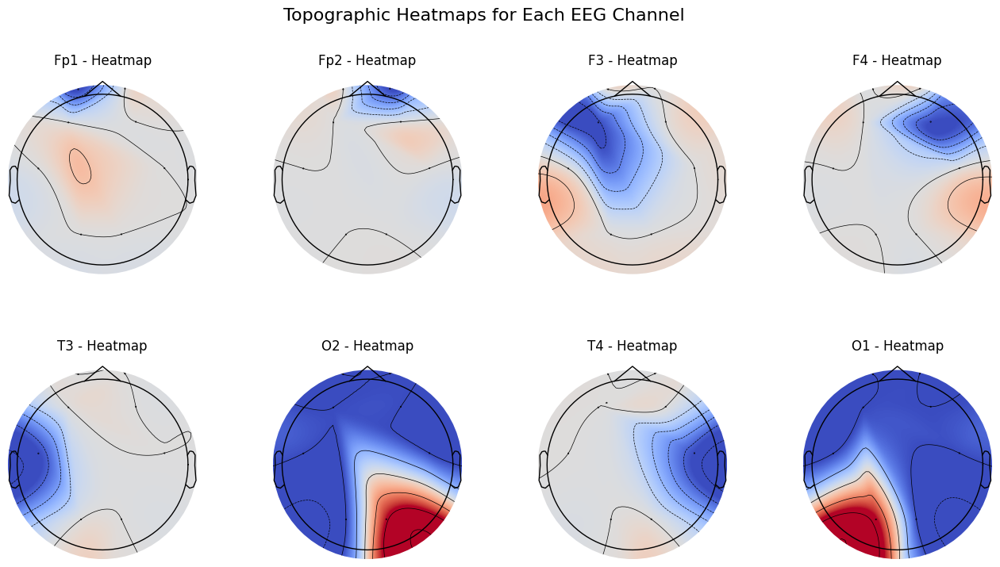

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/SHASHANK Stress.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=30049
    Range : 0 ... 30048 =      0.000 ...   120.192 secs
Ready.


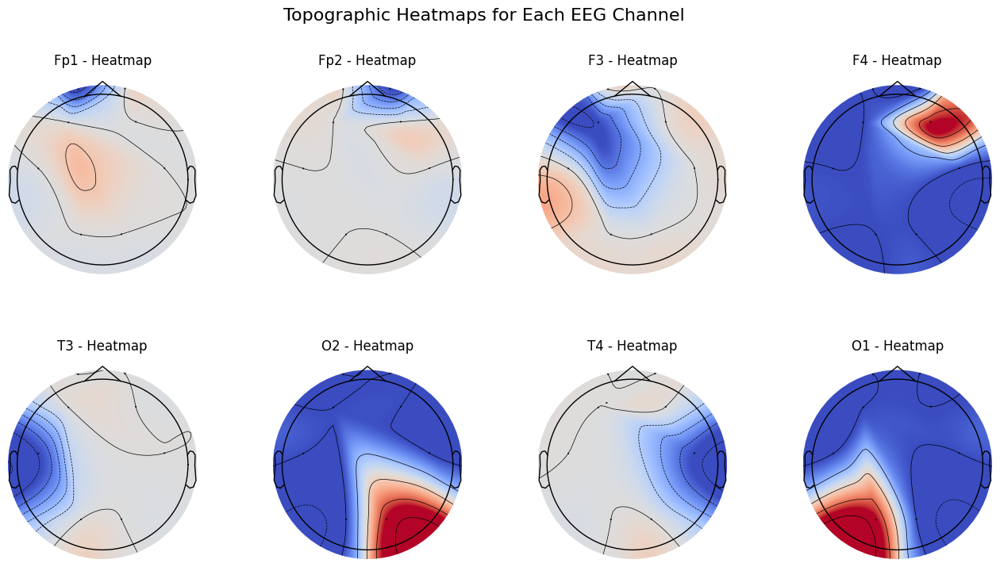

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/SIDDARTH Om.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=31252
    Range : 0 ... 31251 =      0.000 ...   125.004 secs
Ready.


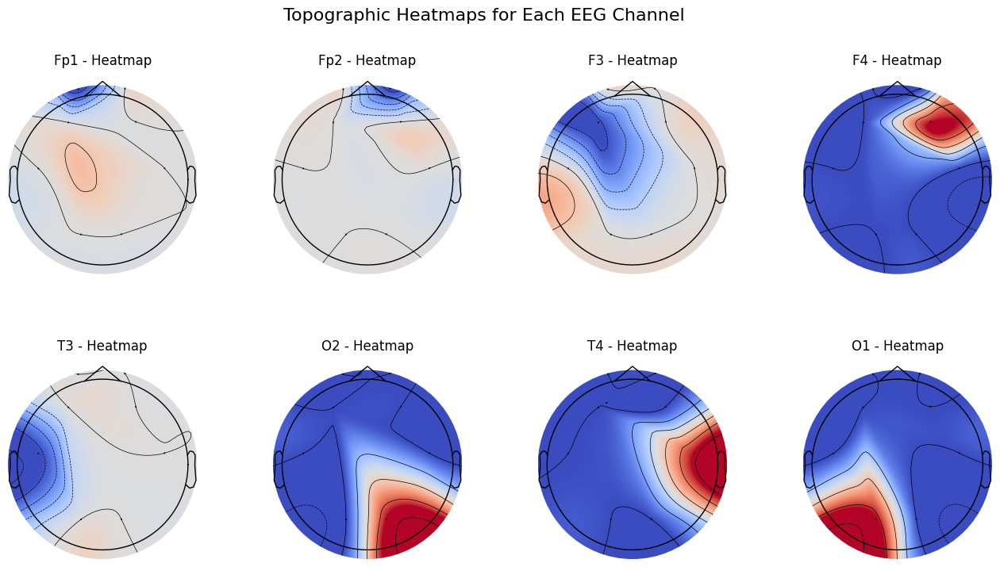

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/SIDDARTH Stress.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names and create an MNE info object
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
info = mne.create_info(channel_names, sfreq=250, ch_types='eeg')  # Adjust the sfreq if needed

# Create a RawArray object from the data
raw = mne.io.RawArray(data, info)

# Set the montage (standard 10-20 system for electrode positions)
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Set up the figure for plotting multiple subplots
fig, axes = plt.subplots(2, 4, figsize=(16, 8))  # 2 rows, 4 columns for 8 channels

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Iterate over each channel and plot its individual topographic heatmap
for i, channel_name in enumerate(channel_names):
    row, col = divmod(i, 4)  # To place each plot in the correct subplot (2 rows, 4 columns)

    # Get the data for the selected channel
    channel_data = data[i, :]  # Select data for the specific channel

    # Compute the average for that channel
    data_avg = np.zeros(len(channel_names))  # Initialize an array for topomap
    data_avg[i] = channel_data.mean()  # Fill only the selected channel's mean value

    # Plot the topomap in the respective subplot
    mne.viz.plot_topomap(data_avg, raw.info, cmap='coolwarm', axes=axes[row, col], show=False)

    # Set the title for each subplot
    axes[row, col].set_title(f'{channel_name} - Heatmap')

# Display the combined figure with all topographic heatmaps
plt.suptitle('Topographic Heatmaps for Each EEG Channel', fontsize=16)  # Add a super title
plt.show()


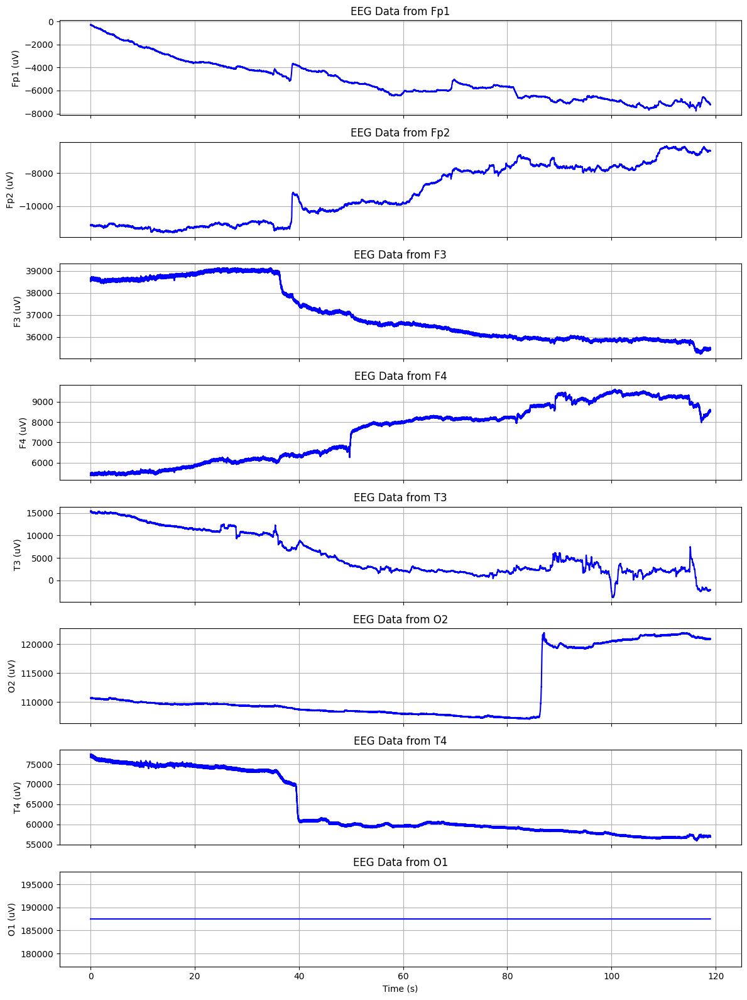

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/AARIN Stress.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Define the sampling frequency (Hz) and the time vector
sfreq = 250  # Assuming a sampling frequency of 250 Hz
times = np.arange(data.shape[1]) / sfreq  # Create a time vector based on number of samples

# Set up the figure for plotting multiple subplots (one for each channel)
fig, axes = plt.subplots(8, 1, figsize=(12, 16), sharex=True)

# Plot each channel's data in its own subplot
for i, ax in enumerate(axes):
    ax.plot(times, data[i, :], color='b')
    ax.set_ylabel(f'{channel_names[i]} (uV)')  # Set label for y-axis (microvolts)
    ax.set_title(f'EEG Data from {channel_names[i]}')
    ax.grid(True)  # Optional: add a grid

# Set a common label for the x-axis (time in seconds)
axes[-1].set_xlabel('Time (s)')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure with all EEG channel plots
plt.show()


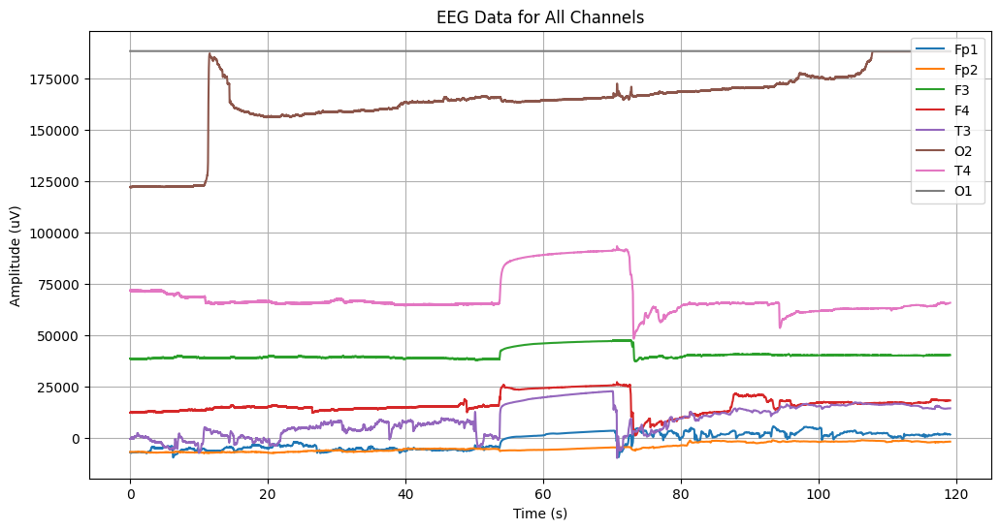

In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load EEG data from an Excel file (adjust file path accordingly)
eeg_data = pd.read_excel('/content/EEGdata/AARIN om.xlsx')

# Convert EEG data to a NumPy array and transpose it (channels as rows, time samples as columns)
data = eeg_data.values.T

# Define the 8 channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Define the sampling frequency (Hz) and the time vector
sfreq = 250  # Assuming a sampling frequency of 250 Hz
times = np.arange(data.shape[1]) / sfreq  # Create a time vector based on the number of samples

# Create a figure for plotting
plt.figure(figsize=(12, 6))

# Plot each channel on the same chart
for i, channel in enumerate(channel_names):
    plt.plot(times, data[i, :] + i * 100, label=channel)  # Offset each channel for better separation

# Set labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.title('EEG Data for All Channels')

# Add a legend to show channel names
plt.legend(loc='upper right')

# Display the plot
plt.grid(True)  # Optional: add gridlines
plt.show()


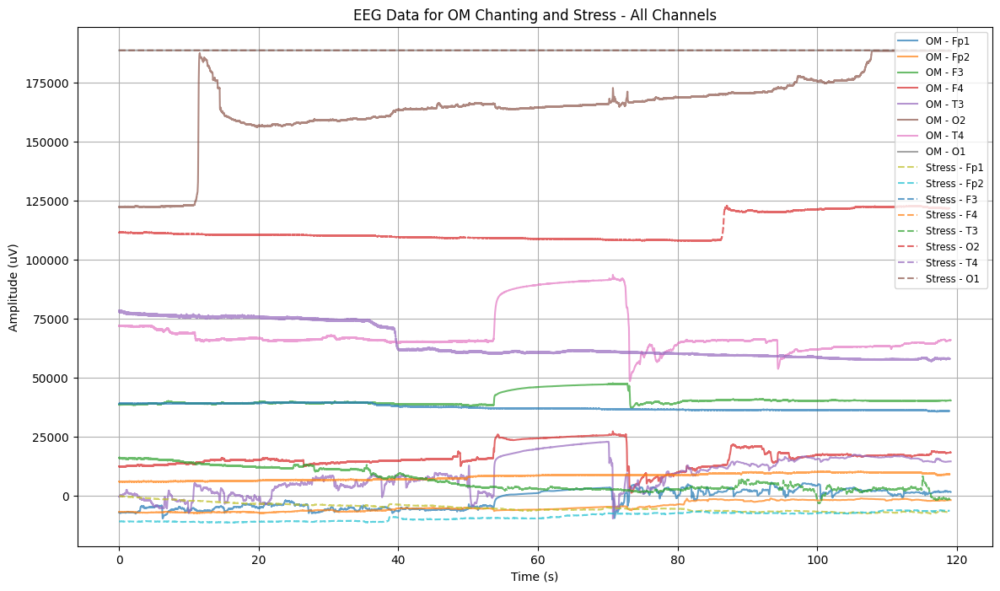

In [4]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/AARIN om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/AARIN Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Define the sampling frequency (Hz) and the time vector
sfreq = 250  # Assuming a sampling frequency of 250 Hz
times_om = np.arange(om_data.shape[1]) / sfreq  # Time vector for OM chanting dataset
times_stress = np.arange(stress_data.shape[1]) / sfreq  # Time vector for stress dataset

# Create a figure for plotting
plt.figure(figsize=(14, 8))

# Plot OM chanting dataset with solid lines
for i, channel in enumerate(channel_names):
    plt.plot(times_om, om_data[i, :] + i * 150, label=f'OM - {channel}', linestyle='-', alpha=0.7)

# Plot Stress dataset with dashed lines
for i, channel in enumerate(channel_names):
    plt.plot(times_stress, stress_data[i, :] + i * 150, label=f'Stress - {channel}', linestyle='--', alpha=0.7)

# Set labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.title('EEG Data for OM Chanting and Stress - All Channels')

# Add a legend to show channel names and condition (OM or Stress)
plt.legend(loc='upper right', fontsize='small')

# Display the plot
plt.grid(True)  # Optional: add gridlines
plt.show()


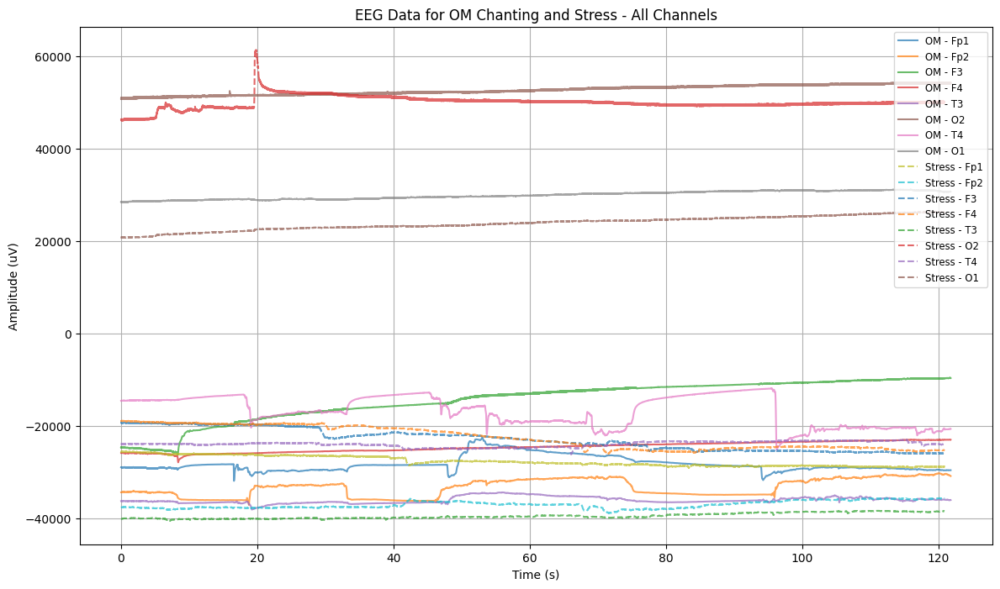

In [5]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/AMOGH om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/AMOGH Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Define the sampling frequency (Hz) and the time vector
sfreq = 250  # Assuming a sampling frequency of 250 Hz
times_om = np.arange(om_data.shape[1]) / sfreq  # Time vector for OM chanting dataset
times_stress = np.arange(stress_data.shape[1]) / sfreq  # Time vector for stress dataset

# Create a figure for plotting
plt.figure(figsize=(14, 8))

# Plot OM chanting dataset with solid lines
for i, channel in enumerate(channel_names):
    plt.plot(times_om, om_data[i, :] + i * 150, label=f'OM - {channel}', linestyle='-', alpha=0.7)

# Plot Stress dataset with dashed lines
for i, channel in enumerate(channel_names):
    plt.plot(times_stress, stress_data[i, :] + i * 150, label=f'Stress - {channel}', linestyle='--', alpha=0.7)

# Set labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.title('EEG Data for OM Chanting and Stress - All Channels')

# Add a legend to show channel names and condition (OM or Stress)
plt.legend(loc='upper right', fontsize='small')

# Display the plot
plt.grid(True)  # Optional: add gridlines
plt.show()


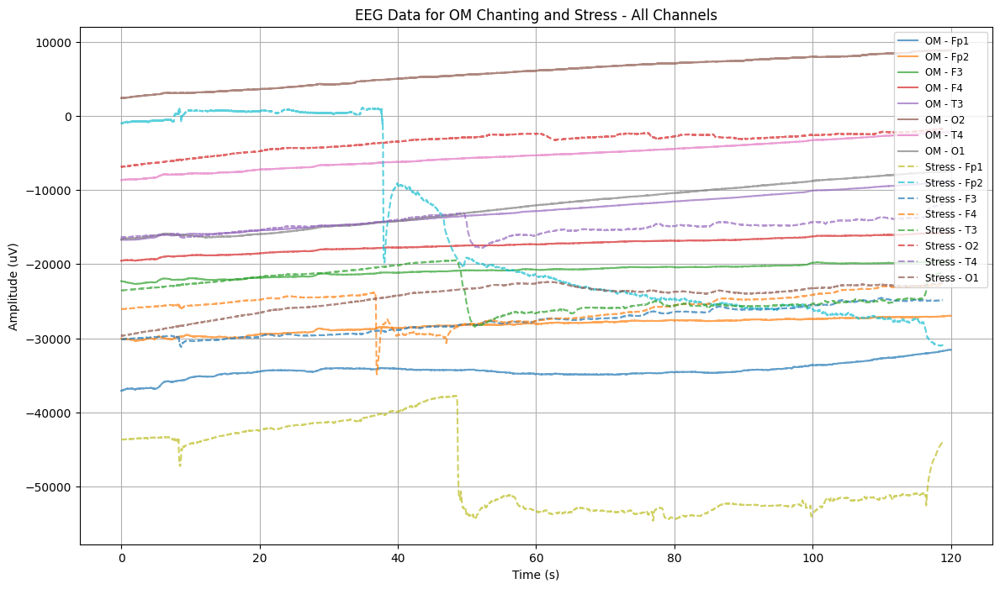

In [6]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/DUSHYANTH Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/DUSHYANTH Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Define the sampling frequency (Hz) and the time vector
sfreq = 250  # Assuming a sampling frequency of 250 Hz
times_om = np.arange(om_data.shape[1]) / sfreq  # Time vector for OM chanting dataset
times_stress = np.arange(stress_data.shape[1]) / sfreq  # Time vector for stress dataset

# Create a figure for plotting
plt.figure(figsize=(14, 8))

# Plot OM chanting dataset with solid lines
for i, channel in enumerate(channel_names):
    plt.plot(times_om, om_data[i, :] + i * 150, label=f'OM - {channel}', linestyle='-', alpha=0.7)

# Plot Stress dataset with dashed lines
for i, channel in enumerate(channel_names):
    plt.plot(times_stress, stress_data[i, :] + i * 150, label=f'Stress - {channel}', linestyle='--', alpha=0.7)

# Set labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.title('EEG Data for OM Chanting and Stress - All Channels')

# Add a legend to show channel names and condition (OM or Stress)
plt.legend(loc='upper right', fontsize='small')

# Display the plot
plt.grid(True)  # Optional: add gridlines
plt.show()


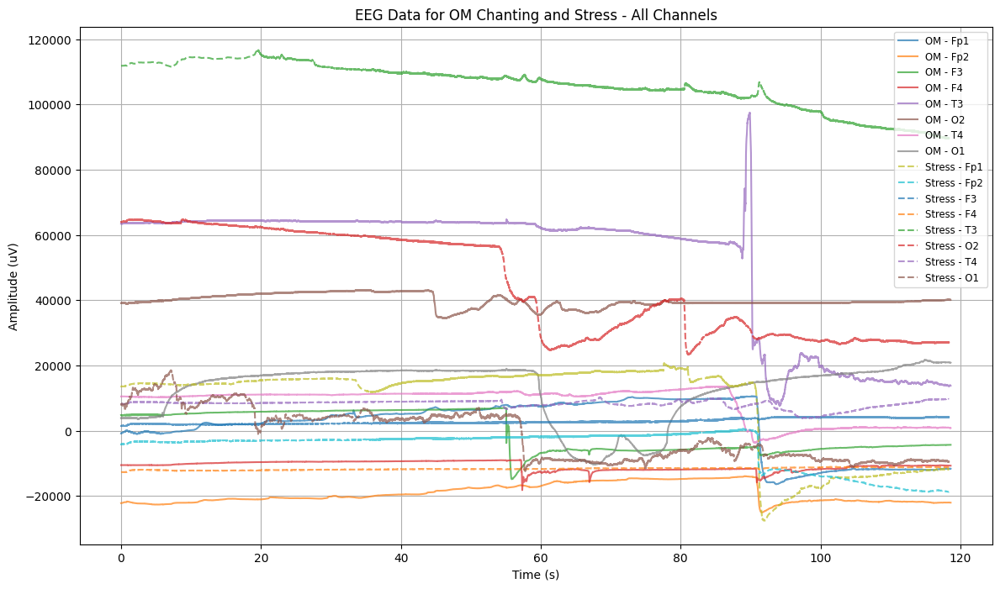

In [9]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/GIRISH Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/GIRISH Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Define the sampling frequency (Hz) and the time vector
sfreq = 250  # Assuming a sampling frequency of 250 Hz
times_om = np.arange(om_data.shape[1]) / sfreq  # Time vector for OM chanting dataset
times_stress = np.arange(stress_data.shape[1]) / sfreq  # Time vector for stress dataset

# Create a figure for plotting
plt.figure(figsize=(14, 8))

# Plot OM chanting dataset with solid lines
for i, channel in enumerate(channel_names):
    plt.plot(times_om, om_data[i, :] + i * 150, label=f'OM - {channel}', linestyle='-', alpha=0.7)

# Plot Stress dataset with dashed lines
for i, channel in enumerate(channel_names):
    plt.plot(times_stress, stress_data[i, :] + i * 150, label=f'Stress - {channel}', linestyle='--', alpha=0.7)

# Set labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.title('EEG Data for OM Chanting and Stress - All Channels')

# Add a legend to show channel names and condition (OM or Stress)
plt.legend(loc='upper right', fontsize='small')

# Display the plot
plt.grid(True)  # Optional: add gridlines
plt.show()


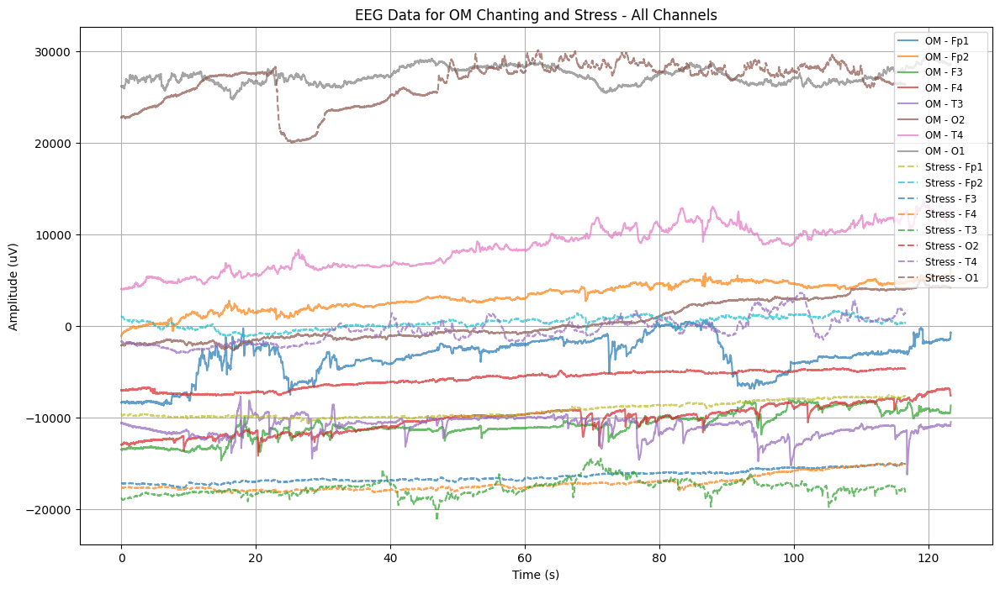

In [10]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/MUKUND Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/MUKUND Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Define the sampling frequency (Hz) and the time vector
sfreq = 250  # Assuming a sampling frequency of 250 Hz
times_om = np.arange(om_data.shape[1]) / sfreq  # Time vector for OM chanting dataset
times_stress = np.arange(stress_data.shape[1]) / sfreq  # Time vector for stress dataset

# Create a figure for plotting
plt.figure(figsize=(14, 8))

# Plot OM chanting dataset with solid lines
for i, channel in enumerate(channel_names):
    plt.plot(times_om, om_data[i, :] + i * 150, label=f'OM - {channel}', linestyle='-', alpha=0.7)

# Plot Stress dataset with dashed lines
for i, channel in enumerate(channel_names):
    plt.plot(times_stress, stress_data[i, :] + i * 150, label=f'Stress - {channel}', linestyle='--', alpha=0.7)

# Set labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.title('EEG Data for OM Chanting and Stress - All Channels')

# Add a legend to show channel names and condition (OM or Stress)
plt.legend(loc='upper right', fontsize='small')

# Display the plot
plt.grid(True)  # Optional: add gridlines
plt.show()


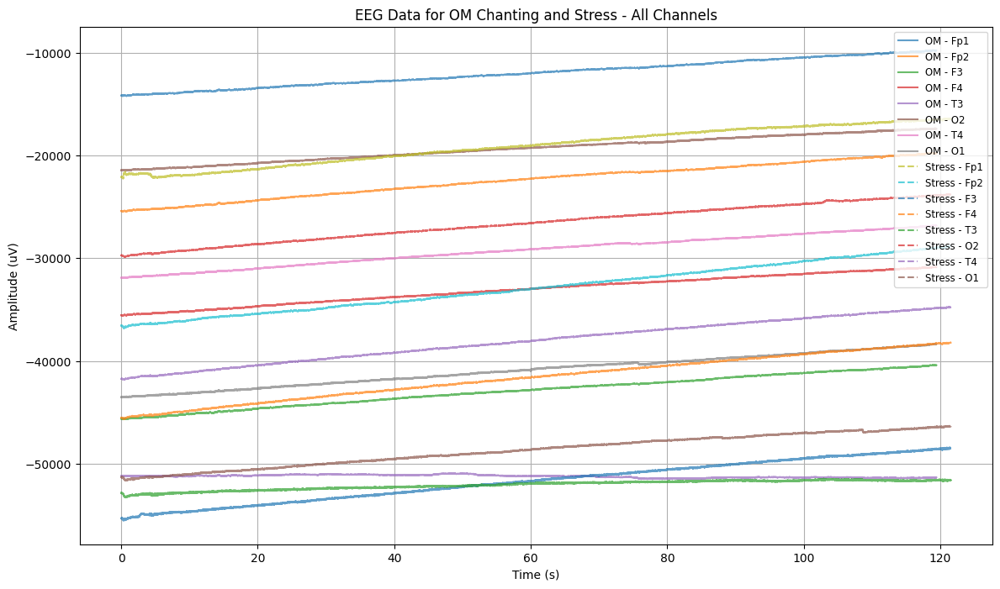

In [11]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/NISCHAL Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/NISCHAL Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Define the sampling frequency (Hz) and the time vector
sfreq = 250  # Assuming a sampling frequency of 250 Hz
times_om = np.arange(om_data.shape[1]) / sfreq  # Time vector for OM chanting dataset
times_stress = np.arange(stress_data.shape[1]) / sfreq  # Time vector for stress dataset

# Create a figure for plotting
plt.figure(figsize=(14, 8))

# Plot OM chanting dataset with solid lines
for i, channel in enumerate(channel_names):
    plt.plot(times_om, om_data[i, :] + i * 150, label=f'OM - {channel}', linestyle='-', alpha=0.7)

# Plot Stress dataset with dashed lines
for i, channel in enumerate(channel_names):
    plt.plot(times_stress, stress_data[i, :] + i * 150, label=f'Stress - {channel}', linestyle='--', alpha=0.7)

# Set labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.title('EEG Data for OM Chanting and Stress - All Channels')

# Add a legend to show channel names and condition (OM or Stress)
plt.legend(loc='upper right', fontsize='small')

# Display the plot
plt.grid(True)  # Optional: add gridlines
plt.show()


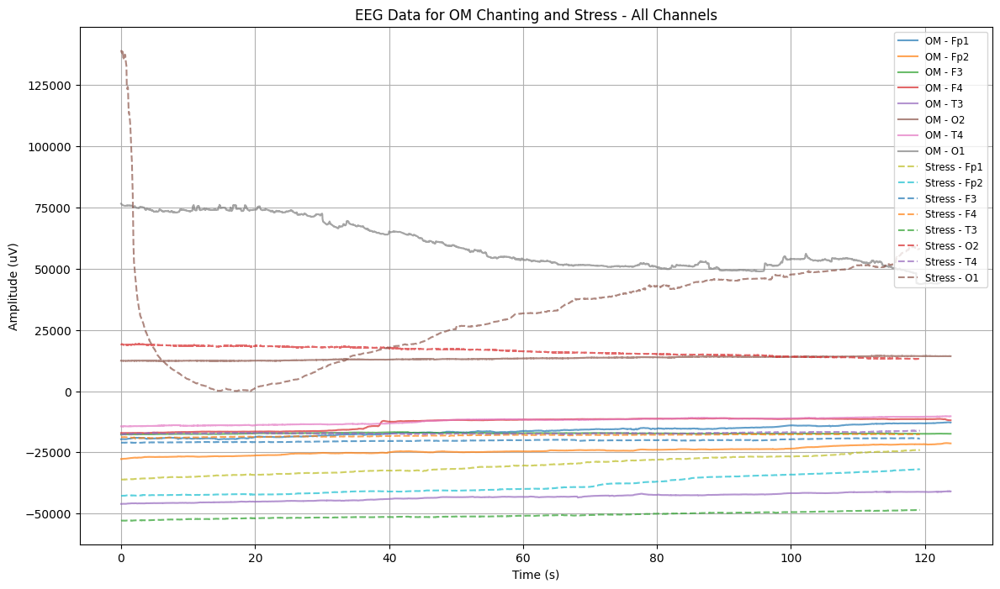

In [12]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/SHASHANK Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/SHASHANK Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Define the sampling frequency (Hz) and the time vector
sfreq = 250  # Assuming a sampling frequency of 250 Hz
times_om = np.arange(om_data.shape[1]) / sfreq  # Time vector for OM chanting dataset
times_stress = np.arange(stress_data.shape[1]) / sfreq  # Time vector for stress dataset

# Create a figure for plotting
plt.figure(figsize=(14, 8))

# Plot OM chanting dataset with solid lines
for i, channel in enumerate(channel_names):
    plt.plot(times_om, om_data[i, :] + i * 150, label=f'OM - {channel}', linestyle='-', alpha=0.7)

# Plot Stress dataset with dashed lines
for i, channel in enumerate(channel_names):
    plt.plot(times_stress, stress_data[i, :] + i * 150, label=f'Stress - {channel}', linestyle='--', alpha=0.7)

# Set labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.title('EEG Data for OM Chanting and Stress - All Channels')

# Add a legend to show channel names and condition (OM or Stress)
plt.legend(loc='upper right', fontsize='small')

# Display the plot
plt.grid(True)  # Optional: add gridlines
plt.show()


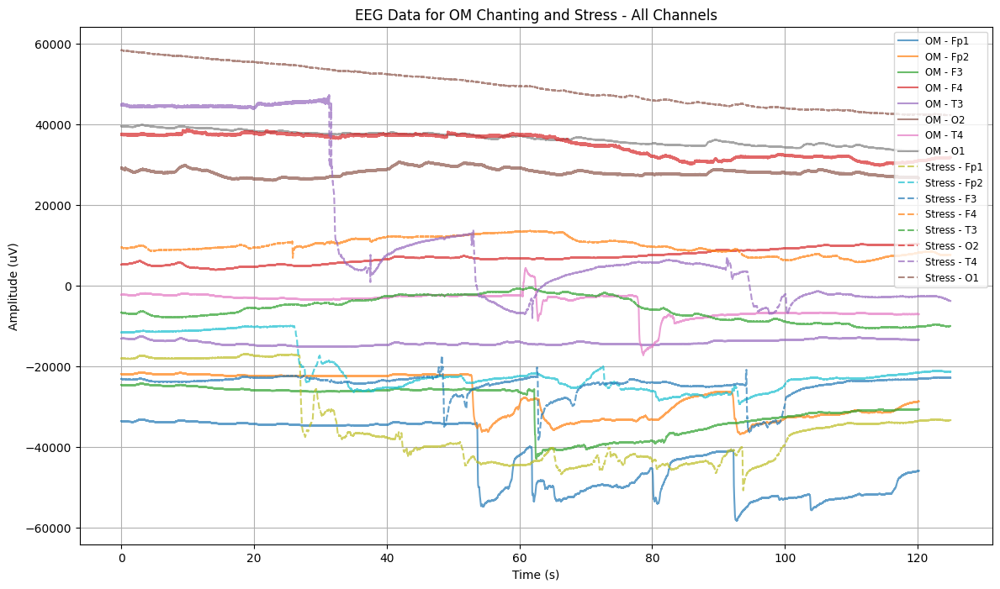

In [13]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/SIDDARTH Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/SIDDARTH Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Define the sampling frequency (Hz) and the time vector
sfreq = 250  # Assuming a sampling frequency of 250 Hz
times_om = np.arange(om_data.shape[1]) / sfreq  # Time vector for OM chanting dataset
times_stress = np.arange(stress_data.shape[1]) / sfreq  # Time vector for stress dataset

# Create a figure for plotting
plt.figure(figsize=(14, 8))

# Plot OM chanting dataset with solid lines
for i, channel in enumerate(channel_names):
    plt.plot(times_om, om_data[i, :] + i * 150, label=f'OM - {channel}', linestyle='-', alpha=0.7)

# Plot Stress dataset with dashed lines
for i, channel in enumerate(channel_names):
    plt.plot(times_stress, stress_data[i, :] + i * 150, label=f'Stress - {channel}', linestyle='--', alpha=0.7)

# Set labels and title
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.title('EEG Data for OM Chanting and Stress - All Channels')

# Add a legend to show channel names and condition (OM or Stress)
plt.legend(loc='upper right', fontsize='small')

# Display the plot
plt.grid(True)  # Optional: add gridlines
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=29781
    Range : 0 ... 29780 =      0.000 ...   119.120 secs
Ready.
Creating RawArray with float64 data, n_channels=8, n_times=29745
    Range : 0 ... 29744 =      0.000 ...   118.976 secs
Ready.


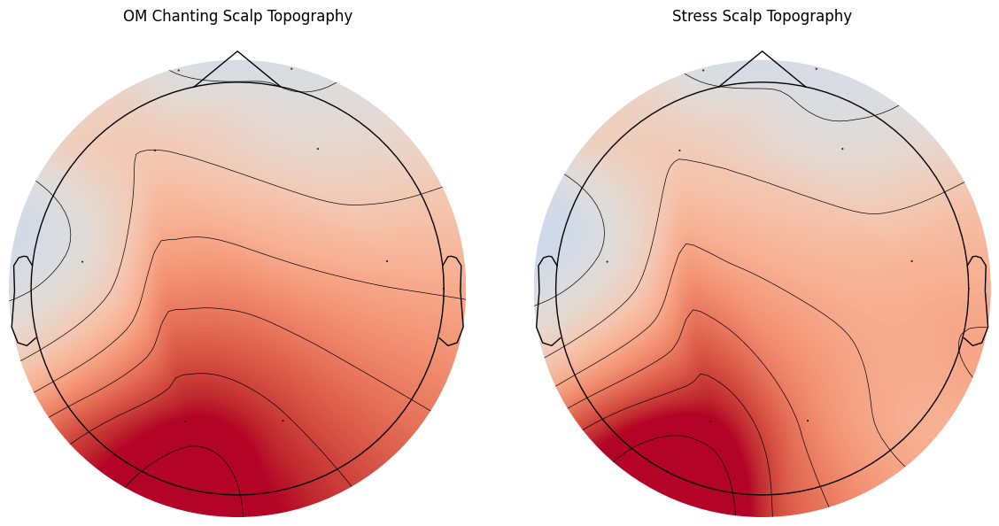

In [7]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/AARIN om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/AARIN Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names and their locations in the 10-20 system
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
montage = mne.channels.make_standard_montage('standard_1020')

# Create MNE info structure (assuming 250 Hz sampling rate)
sfreq = 250
info = mne.create_info(channel_names, sfreq=sfreq, ch_types='eeg')

# Create RawArray objects for both datasets
raw_om = mne.io.RawArray(om_data, info)
raw_stress = mne.io.RawArray(stress_data, info)

# Set the montage for both datasets (to assign correct electrode positions)
raw_om.set_montage(montage)
raw_stress.set_montage(montage)

# Calculate the average data across time for each condition
om_mean = om_data.mean(axis=1)
stress_mean = stress_data.mean(axis=1)

# Plot scalp topographies for OM chanting and Stress data
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot OM chanting topomap
mne.viz.plot_topomap(om_mean, raw_om.info, axes=axes[0], show=False, cmap='coolwarm')
axes[0].set_title('OM Chanting Scalp Topography')

# Plot Stress topomap
mne.viz.plot_topomap(stress_mean, raw_stress.info, axes=axes[1], show=False, cmap='coolwarm')
axes[1].set_title('Stress Scalp Topography')

# Show the plot
plt.tight_layout()
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=30458
    Range : 0 ... 30457 =      0.000 ...   121.828 secs
Ready.
Creating RawArray with float64 data, n_channels=8, n_times=30228
    Range : 0 ... 30227 =      0.000 ...   120.908 secs
Ready.


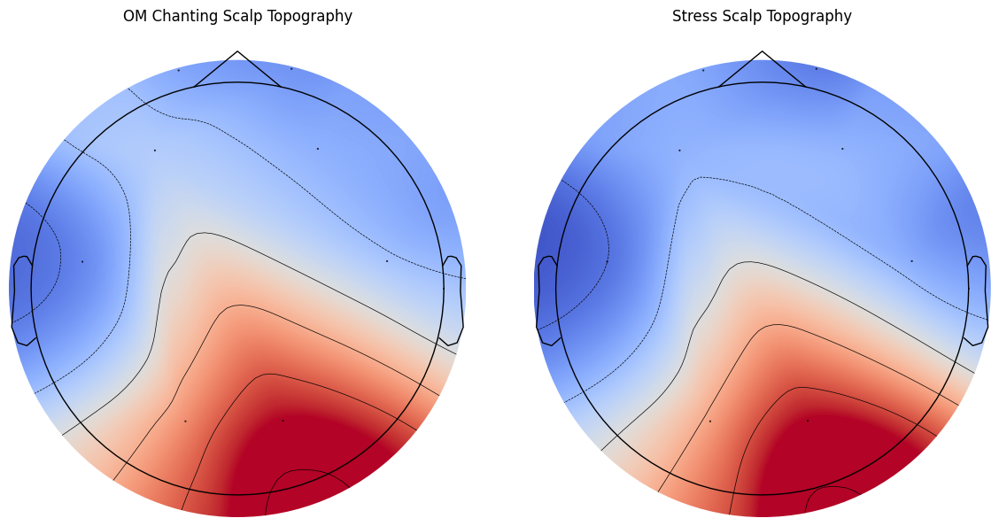

In [8]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/AMOGH om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/AMOGH Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names and their locations in the 10-20 system
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
montage = mne.channels.make_standard_montage('standard_1020')

# Create MNE info structure (assuming 250 Hz sampling rate)
sfreq = 250
info = mne.create_info(channel_names, sfreq=sfreq, ch_types='eeg')

# Create RawArray objects for both datasets
raw_om = mne.io.RawArray(om_data, info)
raw_stress = mne.io.RawArray(stress_data, info)

# Set the montage for both datasets (to assign correct electrode positions)
raw_om.set_montage(montage)
raw_stress.set_montage(montage)

# Calculate the average data across time for each condition
om_mean = om_data.mean(axis=1)
stress_mean = stress_data.mean(axis=1)

# Plot scalp topographies for OM chanting and Stress data
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot OM chanting topomap
mne.viz.plot_topomap(om_mean, raw_om.info, axes=axes[0], show=False, cmap='coolwarm')
axes[0].set_title('OM Chanting Scalp Topography')

# Plot Stress topomap
mne.viz.plot_topomap(stress_mean, raw_stress.info, axes=axes[1], show=False, cmap='coolwarm')
axes[1].set_title('Stress Scalp Topography')

# Show the plot
plt.tight_layout()
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=29998
    Range : 0 ... 29997 =      0.000 ...   119.988 secs
Ready.
Creating RawArray with float64 data, n_channels=8, n_times=29708
    Range : 0 ... 29707 =      0.000 ...   118.828 secs
Ready.


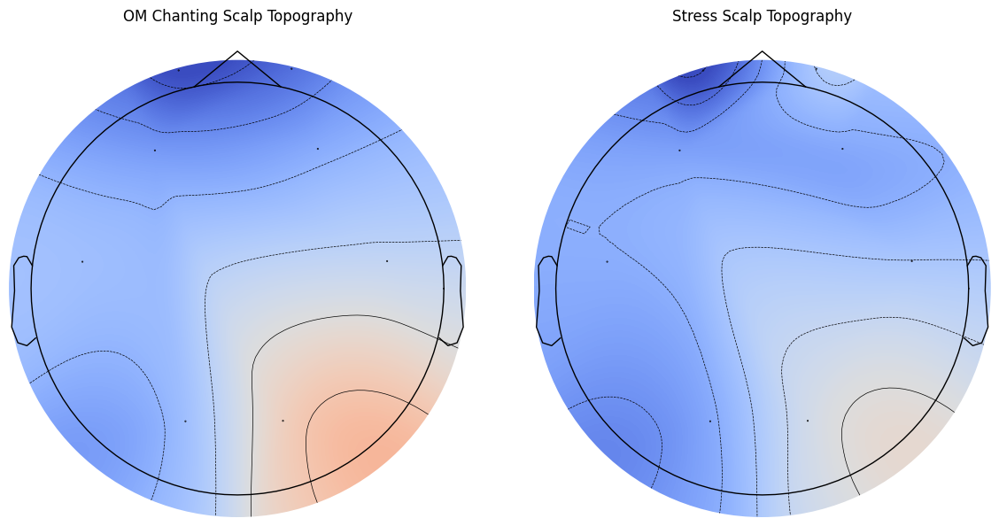

In [14]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/DUSHYANTH Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/DUSHYANTH Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names and their locations in the 10-20 system
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
montage = mne.channels.make_standard_montage('standard_1020')

# Create MNE info structure (assuming 250 Hz sampling rate)
sfreq = 250
info = mne.create_info(channel_names, sfreq=sfreq, ch_types='eeg')

# Create RawArray objects for both datasets
raw_om = mne.io.RawArray(om_data, info)
raw_stress = mne.io.RawArray(stress_data, info)

# Set the montage for both datasets (to assign correct electrode positions)
raw_om.set_montage(montage)
raw_stress.set_montage(montage)

# Calculate the average data across time for each condition
om_mean = om_data.mean(axis=1)
stress_mean = stress_data.mean(axis=1)

# Plot scalp topographies for OM chanting and Stress data
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot OM chanting topomap
mne.viz.plot_topomap(om_mean, raw_om.info, axes=axes[0], show=False, cmap='coolwarm')
axes[0].set_title('OM Chanting Scalp Topography')

# Plot Stress topomap
mne.viz.plot_topomap(stress_mean, raw_stress.info, axes=axes[1], show=False, cmap='coolwarm')
axes[1].set_title('Stress Scalp Topography')

# Show the plot
plt.tight_layout()
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=29652
    Range : 0 ... 29651 =      0.000 ...   118.604 secs
Ready.
Creating RawArray with float64 data, n_channels=8, n_times=29591
    Range : 0 ... 29590 =      0.000 ...   118.360 secs
Ready.


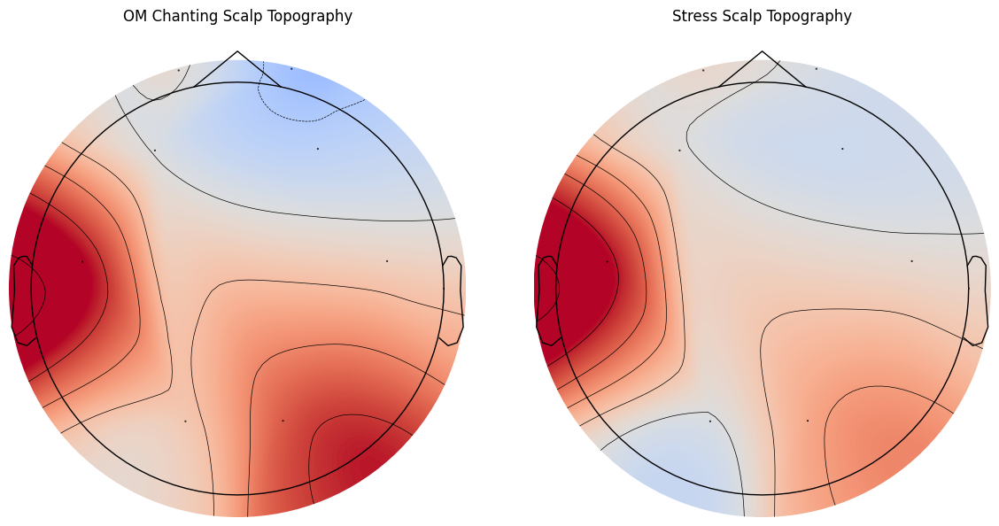

In [15]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/GIRISH Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/GIRISH Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names and their locations in the 10-20 system
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
montage = mne.channels.make_standard_montage('standard_1020')

# Create MNE info structure (assuming 250 Hz sampling rate)
sfreq = 250
info = mne.create_info(channel_names, sfreq=sfreq, ch_types='eeg')

# Create RawArray objects for both datasets
raw_om = mne.io.RawArray(om_data, info)
raw_stress = mne.io.RawArray(stress_data, info)

# Set the montage for both datasets (to assign correct electrode positions)
raw_om.set_montage(montage)
raw_stress.set_montage(montage)

# Calculate the average data across time for each condition
om_mean = om_data.mean(axis=1)
stress_mean = stress_data.mean(axis=1)

# Plot scalp topographies for OM chanting and Stress data
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot OM chanting topomap
mne.viz.plot_topomap(om_mean, raw_om.info, axes=axes[0], show=False, cmap='coolwarm')
axes[0].set_title('OM Chanting Scalp Topography')

# Plot Stress topomap
mne.viz.plot_topomap(stress_mean, raw_stress.info, axes=axes[1], show=False, cmap='coolwarm')
axes[1].set_title('Stress Scalp Topography')

# Show the plot
plt.tight_layout()
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=30834
    Range : 0 ... 30833 =      0.000 ...   123.332 secs
Ready.
Creating RawArray with float64 data, n_channels=8, n_times=29149
    Range : 0 ... 29148 =      0.000 ...   116.592 secs
Ready.


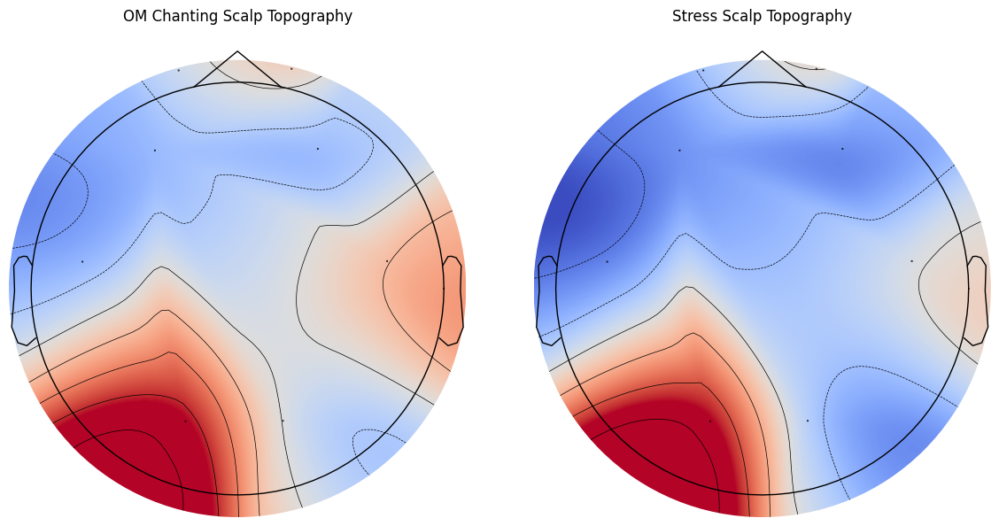

In [16]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/MUKUND Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/MUKUND Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names and their locations in the 10-20 system
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
montage = mne.channels.make_standard_montage('standard_1020')

# Create MNE info structure (assuming 250 Hz sampling rate)
sfreq = 250
info = mne.create_info(channel_names, sfreq=sfreq, ch_types='eeg')

# Create RawArray objects for both datasets
raw_om = mne.io.RawArray(om_data, info)
raw_stress = mne.io.RawArray(stress_data, info)

# Set the montage for both datasets (to assign correct electrode positions)
raw_om.set_montage(montage)
raw_stress.set_montage(montage)

# Calculate the average data across time for each condition
om_mean = om_data.mean(axis=1)
stress_mean = stress_data.mean(axis=1)

# Plot scalp topographies for OM chanting and Stress data
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot OM chanting topomap
mne.viz.plot_topomap(om_mean, raw_om.info, axes=axes[0], show=False, cmap='coolwarm')
axes[0].set_title('OM Chanting Scalp Topography')

# Plot Stress topomap
mne.viz.plot_topomap(stress_mean, raw_stress.info, axes=axes[1], show=False, cmap='coolwarm')
axes[1].set_title('Stress Scalp Topography')

# Show the plot
plt.tight_layout()
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=29859
    Range : 0 ... 29858 =      0.000 ...   119.432 secs
Ready.
Creating RawArray with float64 data, n_channels=8, n_times=30385
    Range : 0 ... 30384 =      0.000 ...   121.536 secs
Ready.


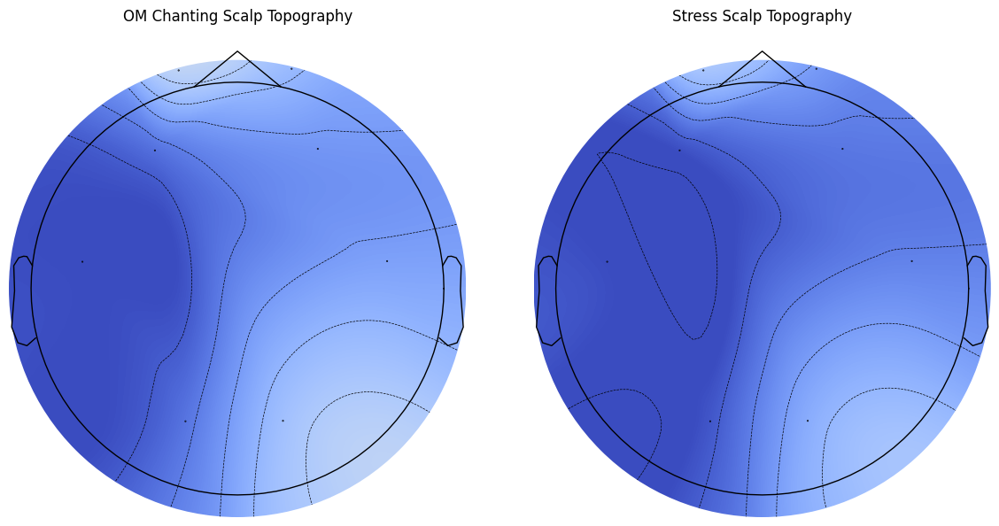

In [17]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/NISCHAL Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/NISCHAL Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names and their locations in the 10-20 system
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
montage = mne.channels.make_standard_montage('standard_1020')

# Create MNE info structure (assuming 250 Hz sampling rate)
sfreq = 250
info = mne.create_info(channel_names, sfreq=sfreq, ch_types='eeg')

# Create RawArray objects for both datasets
raw_om = mne.io.RawArray(om_data, info)
raw_stress = mne.io.RawArray(stress_data, info)

# Set the montage for both datasets (to assign correct electrode positions)
raw_om.set_montage(montage)
raw_stress.set_montage(montage)

# Calculate the average data across time for each condition
om_mean = om_data.mean(axis=1)
stress_mean = stress_data.mean(axis=1)

# Plot scalp topographies for OM chanting and Stress data
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot OM chanting topomap
mne.viz.plot_topomap(om_mean, raw_om.info, axes=axes[0], show=False, cmap='coolwarm')
axes[0].set_title('OM Chanting Scalp Topography')

# Plot Stress topomap
mne.viz.plot_topomap(stress_mean, raw_stress.info, axes=axes[1], show=False, cmap='coolwarm')
axes[1].set_title('Stress Scalp Topography')

# Show the plot
plt.tight_layout()
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=30960
    Range : 0 ... 30959 =      0.000 ...   123.836 secs
Ready.
Creating RawArray with float64 data, n_channels=8, n_times=29813
    Range : 0 ... 29812 =      0.000 ...   119.248 secs
Ready.


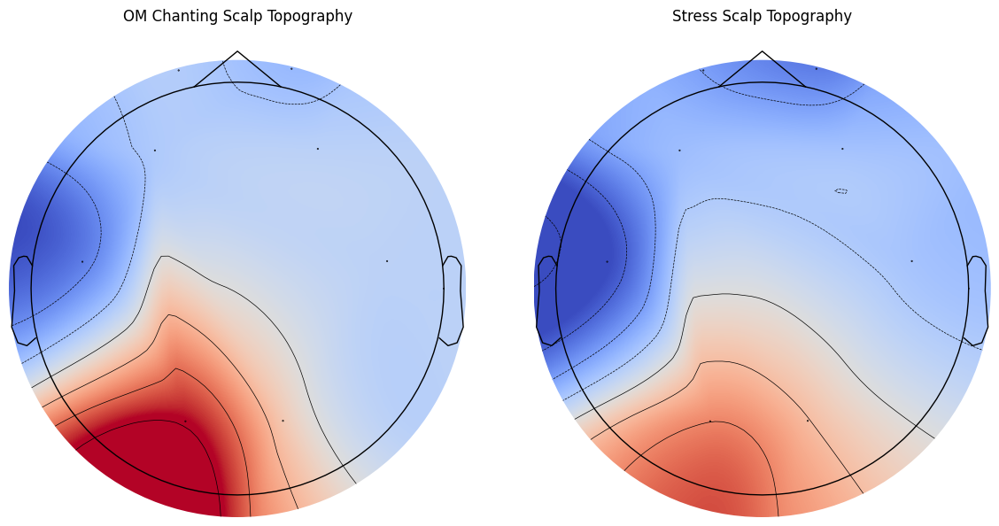

In [19]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/SHASHANK Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/SHASHANK Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names and their locations in the 10-20 system
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
montage = mne.channels.make_standard_montage('standard_1020')

# Create MNE info structure (assuming 250 Hz sampling rate)
sfreq = 250
info = mne.create_info(channel_names, sfreq=sfreq, ch_types='eeg')

# Create RawArray objects for both datasets
raw_om = mne.io.RawArray(om_data, info)
raw_stress = mne.io.RawArray(stress_data, info)

# Set the montage for both datasets (to assign correct electrode positions)
raw_om.set_montage(montage)
raw_stress.set_montage(montage)

# Calculate the average data across time for each condition
om_mean = om_data.mean(axis=1)
stress_mean = stress_data.mean(axis=1)

# Plot scalp topographies for OM chanting and Stress data
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot OM chanting topomap
mne.viz.plot_topomap(om_mean, raw_om.info, axes=axes[0], show=False, cmap='coolwarm')
axes[0].set_title('OM Chanting Scalp Topography')

# Plot Stress topomap
mne.viz.plot_topomap(stress_mean, raw_stress.info, axes=axes[1], show=False, cmap='coolwarm')
axes[1].set_title('Stress Scalp Topography')

# Show the plot
plt.tight_layout()
plt.show()


Creating RawArray with float64 data, n_channels=8, n_times=30049
    Range : 0 ... 30048 =      0.000 ...   120.192 secs
Ready.
Creating RawArray with float64 data, n_channels=8, n_times=31252
    Range : 0 ... 31251 =      0.000 ...   125.004 secs
Ready.


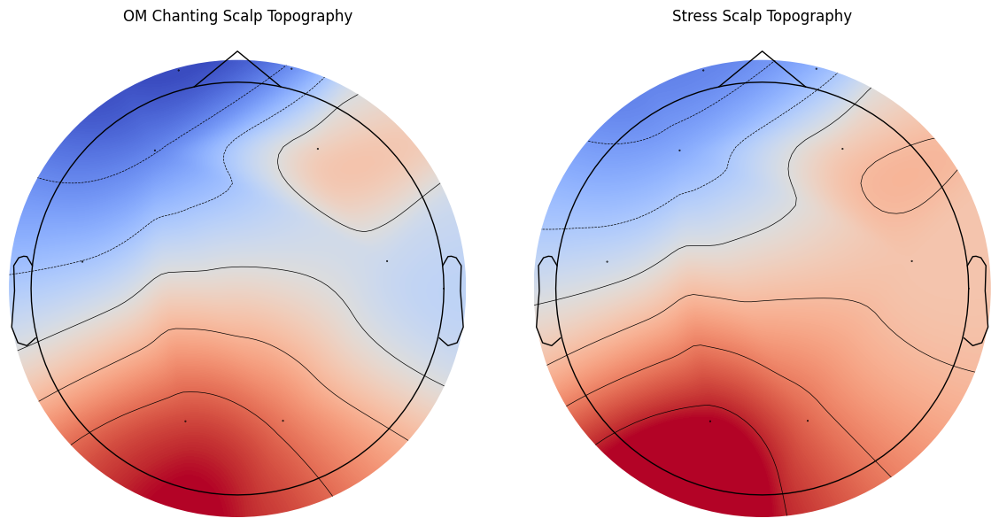

In [18]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/SIDDARTH Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/SIDDARTH Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Define the 8 channel names and their locations in the 10-20 system
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]
montage = mne.channels.make_standard_montage('standard_1020')

# Create MNE info structure (assuming 250 Hz sampling rate)
sfreq = 250
info = mne.create_info(channel_names, sfreq=sfreq, ch_types='eeg')

# Create RawArray objects for both datasets
raw_om = mne.io.RawArray(om_data, info)
raw_stress = mne.io.RawArray(stress_data, info)

# Set the montage for both datasets (to assign correct electrode positions)
raw_om.set_montage(montage)
raw_stress.set_montage(montage)

# Calculate the average data across time for each condition
om_mean = om_data.mean(axis=1)
stress_mean = stress_data.mean(axis=1)

# Plot scalp topographies for OM chanting and Stress data
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot OM chanting topomap
mne.viz.plot_topomap(om_mean, raw_om.info, axes=axes[0], show=False, cmap='coolwarm')
axes[0].set_title('OM Chanting Scalp Topography')

# Plot Stress topomap
mne.viz.plot_topomap(stress_mean, raw_stress.info, axes=axes[1], show=False, cmap='coolwarm')
axes[1].set_title('Stress Scalp Topography')

# Show the plot
plt.tight_layout()
plt.show()


## **Time-Domain Plot**

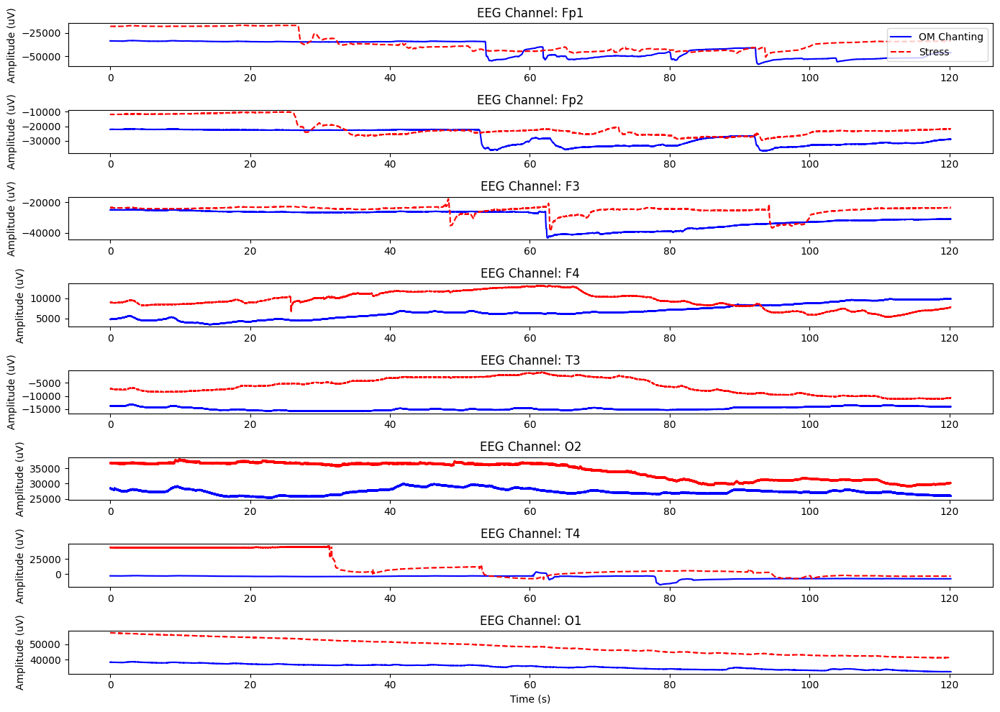

In [25]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/SIDDARTH Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/SIDDARTH Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Truncate the longer dataset to match the shorter one
min_length = min(om_data.shape[1], stress_data.shape[1])
om_data = om_data[:, :min_length]  # Truncate OM chanting data
stress_data = stress_data[:, :min_length]  # Truncate stress data

# Define the 8 channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Define the sampling frequency (Hz) and the time vector
sfreq = 250  # Assuming a sampling frequency of 250 Hz
times = np.arange(min_length) / sfreq  # Create a time vector for the truncated data

# Create a figure for plotting
plt.figure(figsize=(14, 10))

# Plot time-domain data for each channel
for i, channel in enumerate(channel_names):
    plt.subplot(8, 1, i + 1)  # Create a subplot for each channel
    plt.plot(times, om_data[i, :], label='OM Chanting', color='blue')
    plt.plot(times, stress_data[i, :], label='Stress', color='red', linestyle='--')
    plt.title(f'EEG Channel: {channel}')
    plt.ylabel('Amplitude (uV)')
    if i == 0:
        plt.legend(loc='upper right')  # Show legend only on the first subplot

plt.xlabel('Time (s)')
plt.tight_layout()
plt.show()


# Power Spectral Density (PSD)

Creating RawArray with float64 data, n_channels=8, n_times=30049
    Range : 0 ... 30048 =      0.000 ...   120.192 secs
Ready.
Creating RawArray with float64 data, n_channels=8, n_times=30049
    Range : 0 ... 30048 =      0.000 ...   120.192 secs
Ready.
Effective window size : 2.048 (s)
Effective window size : 2.048 (s)


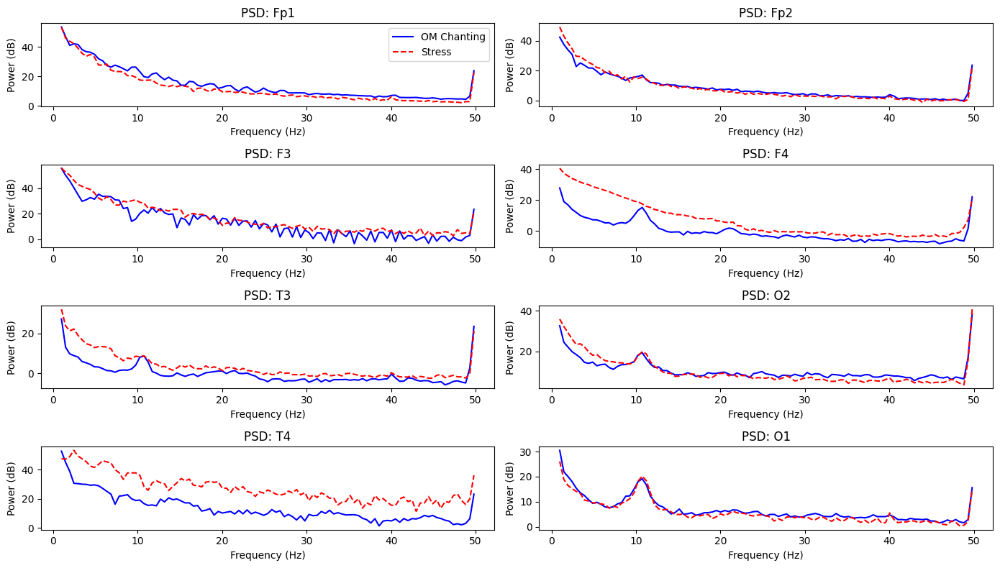

In [27]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/SIDDARTH Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/SIDDARTH Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Truncate the longer dataset to match the shorter one
min_length = min(om_data.shape[1], stress_data.shape[1])
om_data = om_data[:, :min_length]  # Truncate OM chanting data
stress_data = stress_data[:, :min_length]  # Truncate stress data

# Define the channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Create MNE Info object for both datasets (assuming sampling frequency is 250 Hz)
sfreq = 250  # Sampling frequency in Hz
info = mne.create_info(channel_names, sfreq=sfreq, ch_types='eeg')

# Create MNE RawArray objects
raw_om = mne.io.RawArray(om_data, info)
raw_stress = mne.io.RawArray(stress_data, info)

# Compute Power Spectral Density (PSD) for OM chanting data
psd_om = raw_om.compute_psd(fmin=0.5, fmax=50, n_fft=512)
freqs_om = psd_om.freqs
psd_om_values = psd_om.get_data()

# Compute PSD for stress data
psd_stress = raw_stress.compute_psd(fmin=0.5, fmax=50, n_fft=512)
freqs_stress = psd_stress.freqs
psd_stress_values = psd_stress.get_data()

# Plot PSD for both OM chanting and stress data
plt.figure(figsize=(14, 8))
for i, channel in enumerate(channel_names):
    plt.subplot(4, 2, i + 1)  # Create a subplot for each channel
    plt.plot(freqs_om, 10 * np.log10(psd_om_values[i, :]), label='OM Chanting', color='blue')
    plt.plot(freqs_stress, 10 * np.log10(psd_stress_values[i, :]), label='Stress', color='red', linestyle='--')
    plt.title(f'PSD: {channel}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power (dB)')
    if i == 0:
        plt.legend(loc='upper right')  # Show legend only on the first subplot

plt.tight_layout()
plt.show()


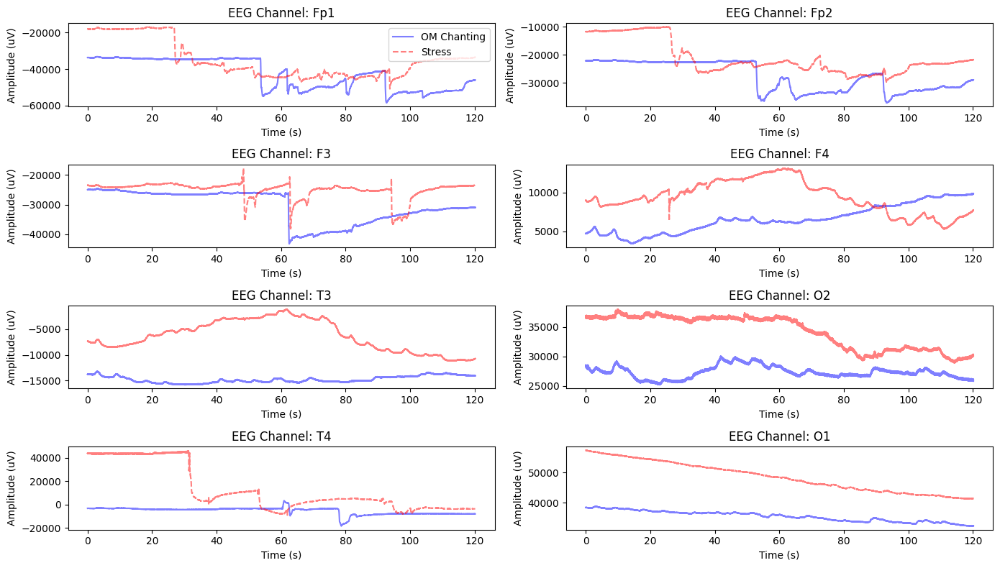

In [29]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load both datasets (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/SIDDARTH Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/SIDDARTH Stress.xlsx')

# Convert both datasets to NumPy arrays and transpose them (channels as rows, time samples as columns)
om_data = om_data.values.T
stress_data = stress_data.values.T

# Truncate the longer dataset to match the shorter one
min_length = min(om_data.shape[1], stress_data.shape[1])
om_data = om_data[:, :min_length]  # Truncate OM chanting data
stress_data = stress_data[:, :min_length]  # Truncate stress data

# Define the channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Create MNE Info object (assuming sampling frequency is 250 Hz)
sfreq = 250  # Sampling frequency in Hz
info = mne.create_info(channel_names, sfreq=sfreq, ch_types='eeg')

# Create time vector (in seconds)
times = np.arange(min_length) / sfreq

# Plot time-domain EEG data for both OM chanting and stress data
plt.figure(figsize=(14, 8))
for i, channel in enumerate(channel_names):
    plt.subplot(4, 2, i + 1)  # Create a subplot for each channel
    plt.plot(times, om_data[i, :], label='OM Chanting', color='blue', alpha=0.5)
    plt.plot(times, stress_data[i, :], label='Stress', color='red', linestyle='--', alpha=0.5)
    plt.title(f'EEG Channel: {channel}')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (uV)')
    if i == 0:
        plt.legend(loc='upper right')  # Show legend only on the first subplot

plt.tight_layout()
plt.show()


# Brain Wave Band Analysis (Bar Chart)

Creating RawArray with float64 data, n_channels=8, n_times=30049
    Range : 0 ... 30048 =      0.000 ...   120.192 secs
Ready.
Creating RawArray with float64 data, n_channels=8, n_times=30049
    Range : 0 ... 30048 =      0.000 ...   120.192 secs
Ready.
Effective window size : 2.048 (s)
Effective window size : 2.048 (s)


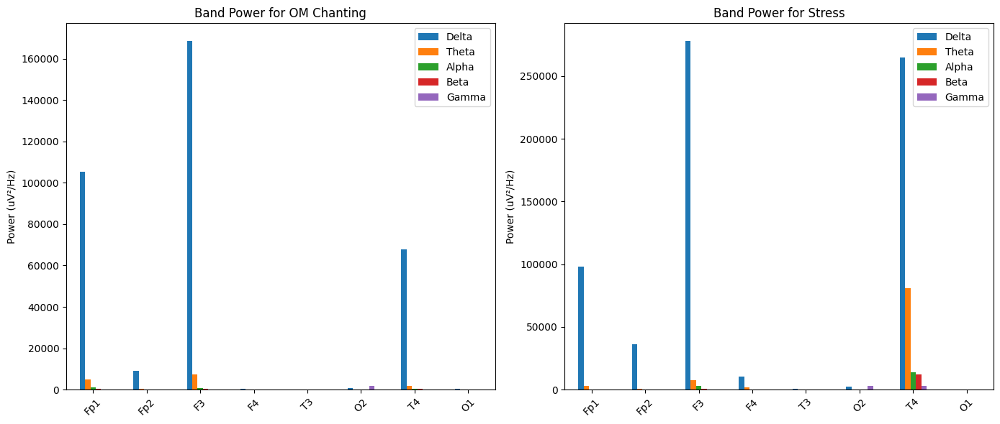

In [37]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the EEG data (adjust file paths accordingly)
om_data = pd.read_excel('/content/EEGdata/SIDDARTH Om.xlsx')
stress_data = pd.read_excel('/content/EEGdata/SIDDARTH Stress.xlsx')

# Convert to NumPy arrays and transpose
om_data = om_data.values.T
stress_data = stress_data.values.T

# Truncate datasets to the same length
min_length = min(om_data.shape[1], stress_data.shape[1])
om_data = om_data[:, :min_length]
stress_data = stress_data[:, :min_length]

# Define channel names
channel_names = ["Fp1", "Fp2", "F3", "F4", "T3", "O2", "T4", "O1"]

# Create MNE Info object
sfreq = 250  # Sampling frequency in Hz
info = mne.create_info(channel_names, sfreq=sfreq, ch_types='eeg')

# Create RawArray objects
raw_om = mne.io.RawArray(om_data, info)
raw_stress = mne.io.RawArray(stress_data, info)

# Define frequency bands (in Hz)
bands = {
    'Delta': (0.5, 4),
    'Theta': (4, 8),
    'Alpha': (8, 13),
    'Beta': (13, 30),
    'Gamma': (30, 50)
}

# Function to compute band power
def compute_band_power(raw, bands):
    # Compute the PSD
    psd = raw.compute_psd(fmin=0.5, fmax=50, n_fft=512)

    band_power = {}
    freqs = psd.freqs  # Access the frequencies from the PSD object
    psd_data = psd.get_data()  # Get the actual PSD data

    for band, (fmin, fmax) in bands.items():
        # Find the frequency indices
        freq_indices = np.where((freqs >= fmin) & (freqs <= fmax))[0]
        band_power[band] = np.trapz(psd_data[:, freq_indices], freqs[freq_indices], axis=1)  # Integrate to get power

    return band_power

# Calculate band power for OM chanting and stress data
band_power_om = compute_band_power(raw_om, bands)
band_power_stress = compute_band_power(raw_stress, bands)

# Convert band power to DataFrame for easier analysis
band_power_df_om = pd.DataFrame(band_power_om, index=channel_names)
band_power_df_stress = pd.DataFrame(band_power_stress, index=channel_names)

# Plot band power for OM chanting and stress data
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Bar chart for OM chanting
band_power_df_om.plot(kind='bar', ax=axes[0], title='Band Power for OM Chanting', legend=True)
axes[0].set_ylabel('Power (uV²/Hz)')
axes[0].set_xticklabels(channel_names, rotation=45)

# Bar chart for stress
band_power_df_stress.plot(kind='bar', ax=axes[1], title='Band Power for Stress', legend=True)
axes[1].set_ylabel('Power (uV²/Hz)')
axes[1].set_xticklabels(channel_names, rotation=45)

plt.tight_layout()
plt.show()
